### Importing libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

### Descriptive Analytics

In [2]:
df = pd.read_csv("D:/4-PROJECT/CAPSTONE/Dataset/IFND.csv/IFND_data.csv")
df

,id,Statement,Image,Web,Category,Date,Label
0,2,"WHO praises India's Aarogya Setu app, says it ...",https://cdn.dnaindia.com/sites/default/files/s...,DNAINDIA,COVID-19,Oct-20,TRUE
1,3,"In Delhi, Deputy US Secretary of State Stephen...",https://cdn.dnaindia.com/sites/default/files/s...,DNAINDIA,VIOLENCE,Oct-20,TRUE
2,4,LAC tensions: China's strategy behind delibera...,https://cdn.dnaindia.com/sites/default/files/s...,DNAINDIA,TERROR,Oct-20,TRUE
3,5,India has signed 250 documents on Space cooper...,https://cdn.dnaindia.com/sites/default/files/s...,DNAINDIA,COVID-19,Oct-20,TRUE
4,6,Tamil Nadu chief minister's mother passes away...,https://cdn.dnaindia.com/sites/default/files/s...,DNAINDIA,ELECTION,Oct-20,TRUE
...,...,...,...,...,...,...,...
56709,56711,Fact Check: This is not Bruce Lee playing ping...,https://akm-img-a-in.tosshub.com/indiatoday/im...,INDIATODAY,MISLEADING,Nov-19,Fake
56710,56712,Fact Check: Did Japan construct this bridge in...,https://akm-img-a-in.tosshub.com/indiatoday/im...,INDIATODAY,COVID-19,Oct-19,Fake
56711,56713,Fact Check: Viral video of Mexico earthquake i...,https://akm-img-a-in.tosshub.com/indiatoday/im...,INDIATODAY,MISLEADING,Oct-19,Fake
56712,56714,Fact Check: Ballet performance by Chinese coup...,https://akm-img-a-in.tosshub.com/indiatoday/im...,INDIATODAY,COVID-19,Sep-19,Fake


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56714 entries, 0 to 56713
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         56714 non-null  int64 
 1   Statement  56714 non-null  object
 2   Image      56714 non-null  object
 3   Web        56714 non-null  object
 4   Category   56714 non-null  object
 5   Date       45393 non-null  object
 6   Label      56714 non-null  object
dtypes: int64(1), object(6)
memory usage: 3.0+ MB


In [4]:
df.describe(include='object')

,Statement,Image,Web,Category,Date,Label
count,56714,56714,56714,56714,45393,56714
unique,51090,46755,29,9,129,2
top,Fact Checked: It was not RaGa s aide who slapp...,https://static.theprint.in/wp-content/uploads/...,TRIBUNEINDIA,GOVERNMENT,Oct-20,TRUE
freq,3,25,11832,10923,4200,37800


In [5]:
df.describe()

,id
count,56714.00000
mean,28358.50000
std,16372.06592
min,2.00000
25%,14180.25000
50%,28358.50000
75%,42536.75000
max,56715.00000


### Data Preparation

### Handling Inconsistent data

In [6]:
(pd.DataFrame(df['Web'].value_counts()).reset_index()).sort_values(by='Web')

,Web,count
15,AFP,267
24,ALT,59
1,AUGMENT,11321
8,BOOMLIVE,806
12,BSMEDIA,449
9,CNN,778
22,DAPAAN,136
18,DIGITEYE,175
23,DNAINDIA,121
26,ENGLISHTRIBUNE,21


In [7]:
df['Web'] = df['Web'].replace({'INDUSTANTIMES':'HINDUSTANTIMES','THELOGICALINDIA':'THELOGICALINDIAN', 'THESTATEMAN':'THESTATESMAN'})

In [8]:
(pd.DataFrame(df['Web'].value_counts()).reset_index()).sort_values(by='Web')

,Web,count
15,AFP,267
22,ALT,59
1,AUGMENT,11321
7,BOOMLIVE,806
11,BSMEDIA,449
8,CNN,778
20,DAPAAN,136
17,DIGITEYE,175
21,DNAINDIA,121
24,ENGLISHTRIBUNE,21


In [9]:
df['Category'].value_counts()

Category
GOVERNMENT    10923
VIOLENCE      10578
COVID-19       8710
POLITICS       8670
ELECTION       8396
TERROR         4384
MISLEADING     4059
TRAD            976
MISLEADIND       18
Name: count, dtype: int64

In [10]:
df['Category'] = df['Category'].replace('MISLEADIND', 'MISLEADING')

In [11]:
df['Category'].value_counts()

Category
GOVERNMENT    10923
VIOLENCE      10578
COVID-19       8710
POLITICS       8670
ELECTION       8396
TERROR         4384
MISLEADING     4077
TRAD            976
Name: count, dtype: int64

In [12]:
df['Date'].value_counts()

Date
Oct-20    4200
Aug-20    3349
Sep-20    3106
Nov-20    3016
Jun-20    2746
          ... 
Oct-11       1
Aug-11       1
Jul-11       1
May-11       1
Nov-12       1
Name: count, Length: 129, dtype: int64

In [13]:
#df['Date'] = pd.to_datetime(df['Date'],format='%b-%y') # Convert 'Date' column to datetime format

In [14]:
df[(df['Date'].astype(str).str.match(r'^\d{1,2}/\d{4}$'))]

,id,Statement,Image,Web,Category,Date,Label
25245,25247,"""Epic Games"" ⯤ ? ? ...",https://static.arabic.cnn.com/sites/default/fi...,CNN,VIOLENCE,20/2020,TRUE
25322,25324,Louvre Abu Dhabi: Enter the 'universal museum'...,https://edition.cnn.com/interactive/2019/11/st...,CNN,POLITICS,19/2020,TRUE
25439,25441,This storm chaser ۪s photos all began with Bru...,https://cdn.cnn.com/cnn/interactive/2020/04/we...,CNN,POLITICS,20/2020,TRUE
25447,25449,"Fashion, beauty, design, art, architecture and...",https://i2.cdn.turner.com/cnn/2017/images/09/1...,CNN,GOVERNMENT,17/2020,TRUE
25467,25469,The CNN Guns Project,https://i.cdn.turner.com/cnn/interactive/2014/...,CNN,POLITICS,14/2020,TRUE
25575,25577,How billionaire owners changed European football,https://www.cnn.com/interactive/2020/06/sport/...,CNN,POLITICS,20/2020,TRUE
25576,25578,܉ Liverpool: The agonizing wait for a first...,https://www.cnn.com/interactive/2020/04/sport/...,CNN,ELECTION,20/2020,TRUE
25577,25579,Peak Lenin: Climbing disaster showcased braver...,https://www.cnn.com/interactive/2020/01/sport/...,CNN,POLITICS,20/2020,TRUE
25579,25581,My father buried his parents and sister wit...,https://cdn.cnn.com/cnn/interactive/2019/06/sp...,CNN,ELECTION,19/2020,TRUE
25583,25585,Gay Bowl attracts NFL sponsors and touches lives,https://cdn.cnn.com/cnnnext/dam/assets/1810091...,CNN,GOVERNMENT,18/2018,TRUE


In [15]:
df = df[~(df['Date'].astype(str).str.match(r'^\d{1,2}/\d{4}$'))]

In [16]:
df.shape

(56704, 7)

In [17]:
df['Date'] = pd.to_datetime(df['Date'], format='%b-%y')

C:\Users\mkiru\AppData\Local\Temp\ipykernel_24884\1046318290.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = pd.to_datetime(df['Date'], format='%b-%y')


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 56704 entries, 0 to 56713
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   id         56704 non-null  int64         
 1   Statement  56704 non-null  object        
 2   Image      56704 non-null  object        
 3   Web        56704 non-null  object        
 4   Category   56704 non-null  object        
 5   Date       45383 non-null  datetime64[ns]
 6   Label      56704 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 3.5+ MB


### Handling Outlier

In [19]:
df['Date'].describe()

count                            45383
mean     2020-11-21 12:01:53.275896064
min                2004-08-01 00:00:00
25%                2020-03-01 00:00:00
50%                2020-08-01 00:00:00
75%                2020-11-01 00:00:00
max                2024-12-01 00:00:00
Name: Date, dtype: object

In [20]:
dates_in_2004 = df[df['Date'].dt.year == 2004]
dates_in_2004

,id,Statement,Image,Web,Category,Date,Label
30964,30966,Heritage Conservation Committee approves const...,https://static.theprint.in/wp-content/uploads/...,THEPRINT,POLITICS,2004-08-01,TRUE


In [21]:
dates_in_2024 = df[df['Date'].dt.year == 2024]
dates_in_2024.shape

(7172, 7)

In [22]:
df=df[df['Date'].dt.year != 2004]

In [23]:
df.shape

(56703, 7)

### Handling Null/Missing Values

In [24]:
df['Date'].isnull().sum()

11321

In [25]:
result = df[df.isnull().any(axis=1)]
result.groupby('Label')['id'].count()

Label
Fake    11321
Name: id, dtype: int64

### Case Conversion

In [26]:
df['Label'].value_counts()

Label
TRUE    37789
Fake    18914
Name: count, dtype: int64

In [27]:
df.loc[:,'Label'] = df['Label'].str.upper()

In [28]:
df['Label'].value_counts()

Label
TRUE    37789
FAKE    18914
Name: count, dtype: int64

### Filtering

In [29]:
df = df.drop(columns=['id','Image'])
df.head()

,Statement,Web,Category,Date,Label
0,"WHO praises India's Aarogya Setu app, says it ...",DNAINDIA,COVID-19,2020-10-01,TRUE
1,"In Delhi, Deputy US Secretary of State Stephen...",DNAINDIA,VIOLENCE,2020-10-01,TRUE
2,LAC tensions: China's strategy behind delibera...,DNAINDIA,TERROR,2020-10-01,TRUE
3,India has signed 250 documents on Space cooper...,DNAINDIA,COVID-19,2020-10-01,TRUE
4,Tamil Nadu chief minister's mother passes away...,DNAINDIA,ELECTION,2020-10-01,TRUE


### Handling Duplicates

In [30]:
duplicates = df.duplicated()
df_duplicates = df[duplicates]
df_duplicates.head()


,Statement,Web,Category,Date,Label
6124,Jaishankar at Quad meet: India committed to re...,INDIANEXPRESS,TERROR,2020-10-01,TRUE
6748,Ramesh Pokhriyal Nishank to e-inaugurate infra...,THESTATESMAN,GOVERNMENT,2020-06-01,TRUE
7469,Over 3000 COVID-19 samples tested at CSIR-NEERI,THESTATESMAN,COVID-19,2020-06-01,TRUE
19056,Media attempting to influence outcome of cases...,TRIBUNEINDIA,TERROR,2020-10-01,TRUE
19059,"Record buying of paddy on MSP, wheat to be sim...",TRIBUNEINDIA,GOVERNMENT,2020-10-01,TRUE


In [31]:
df_duplicates.shape

(1899, 5)

In [32]:
df.shape

(56703, 5)

In [33]:
df.drop_duplicates(inplace=True)
df.shape

(54804, 5)

### Encoding

In [34]:
df.loc[:,'Label_num'] = df['Label'].apply(lambda x:0 if x=='FAKE' else 1)
df.head()

,Statement,Web,Category,Date,Label,Label_num
0,"WHO praises India's Aarogya Setu app, says it ...",DNAINDIA,COVID-19,2020-10-01,TRUE,1
1,"In Delhi, Deputy US Secretary of State Stephen...",DNAINDIA,VIOLENCE,2020-10-01,TRUE,1
2,LAC tensions: China's strategy behind delibera...,DNAINDIA,TERROR,2020-10-01,TRUE,1
3,India has signed 250 documents on Space cooper...,DNAINDIA,COVID-19,2020-10-01,TRUE,1
4,Tamil Nadu chief minister's mother passes away...,DNAINDIA,ELECTION,2020-10-01,TRUE,1


In [35]:
df.reset_index(drop=True, inplace=True)

### Text Preprocessing

In [36]:
import re

# Initialize an empty set to store unique symbols
unique_symbols = set()

# Iterate through each statement in the DataFrame
for index, row in df.iterrows():
    # Find unique symbols in the statement
    symbols = set(re.findall(r'[^a-zA-Z0-9\s]', row['Statement']))
    # Update the set of unique symbols
    unique_symbols.update(symbols)

# Print the unique symbols
print("Unique Symbols:", unique_symbols)


Unique Symbols: {'“', 'ं', 'è', '$', '(', '!', '=', '\u06dd', '.', '#', ',', 'क', '́', ']', '/', '̱', '%', '\u200b', '̍', '*', '̩', '`', 'ब', '—', '”', '£', "'", '–', ';', '"', '[', 'द', '۪', '…', 'é', '₹', '_', '@', '̼', 'र', ':', 'ो', '&', '|', '?', '-', '+', '‘', 'à', '’', ')', '°'}


In [37]:
import nltk
import re
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

# Download necessary resources (if not already downloaded)
# nltk.download('wordnet')
# nltk.download('stopwords')

# Initialize Lemmatizer
lm = WordNetLemmatizer()

# Load stopwords
stop_words = set(stopwords.words('english'))

# Words to Remove
words_to_remove = ['fact', 'check']

# Define a function to preprocess text
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    
    # Remove non-alphanumeric characters and URLs
    text = re.sub(r'https?://\S+|www\.\S+', '', text)
    text = re.sub('[^a-zA-Z0-9]', ' ', text)
    
    # Tokenize the text
    tokens = text.split()
    
    # Lemmatize and remove stopwords
    tokens = [lm.lemmatize(word) for word in tokens if word not in stop_words]
    
    # Remove specific words
    tokens = [word for word in tokens if word not in words_to_remove]
    
    # Join the lemmatized tokens back into a string
    processed_text = " ".join(tokens)
    
    return processed_text

# Apply the preprocessing function to the 'Statement' column
df['processed_statement'] = df['Statement'].apply(preprocess_text)

# Display the DataFrame with the processed text
df

,Statement,Web,Category,Date,Label,Label_num,processed_statement
0,"WHO praises India's Aarogya Setu app, says it ...",DNAINDIA,COVID-19,2020-10-01,TRUE,1,praise india aarogya setu app say helped ident...
1,"In Delhi, Deputy US Secretary of State Stephen...",DNAINDIA,VIOLENCE,2020-10-01,TRUE,1,delhi deputy u secretary state stephen biegun ...
2,LAC tensions: China's strategy behind delibera...,DNAINDIA,TERROR,2020-10-01,TRUE,1,lac tension china strategy behind deliberately...
3,India has signed 250 documents on Space cooper...,DNAINDIA,COVID-19,2020-10-01,TRUE,1,india signed 250 document space cooperation 59...
4,Tamil Nadu chief minister's mother passes away...,DNAINDIA,ELECTION,2020-10-01,TRUE,1,tamil nadu chief minister mother pass away 93
...,...,...,...,...,...,...,...
54799,Fact Check: This is not Bruce Lee playing ping...,INDIATODAY,MISLEADING,2019-11-01,FAKE,0,bruce lee playing ping pong nunchaku
54800,Fact Check: Did Japan construct this bridge in...,INDIATODAY,COVID-19,2019-10-01,FAKE,0,japan construct bridge 24 hour
54801,Fact Check: Viral video of Mexico earthquake i...,INDIATODAY,MISLEADING,2019-10-01,FAKE,0,viral video mexico earthquake 2 year old
54802,Fact Check: Ballet performance by Chinese coup...,INDIATODAY,COVID-19,2019-09-01,FAKE,0,ballet performance chinese couple go viral wro...


### Exploratory Data Analysis

In [38]:
# Word count distribution
df.loc[:,'Word Count'] = df['processed_statement'].apply(lambda x: len(str(x).split()))

# Compute text lengths
df['Text Length'] = df['processed_statement'].apply(len)

# Separate dataset into two datasets for fake and true news
fake_df = df[df['Label'] == 'FAKE']
true_df = df[df['Label'] == 'TRUE']

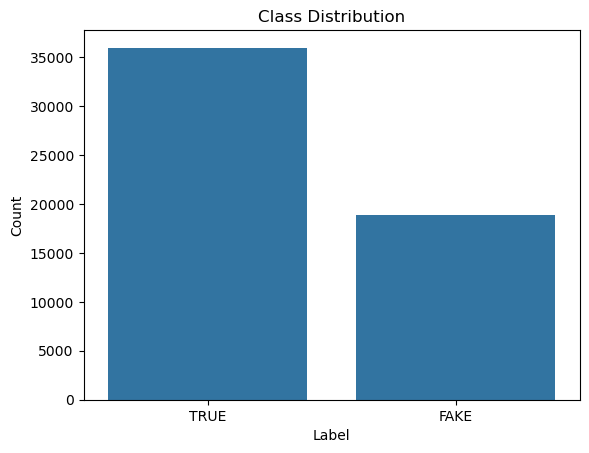

In [39]:
# Visualize class distribution
sns.countplot(x='Label', data=df)
plt.title("Class Distribution")
plt.xlabel("Label")
plt.ylabel("Count")
plt.show()

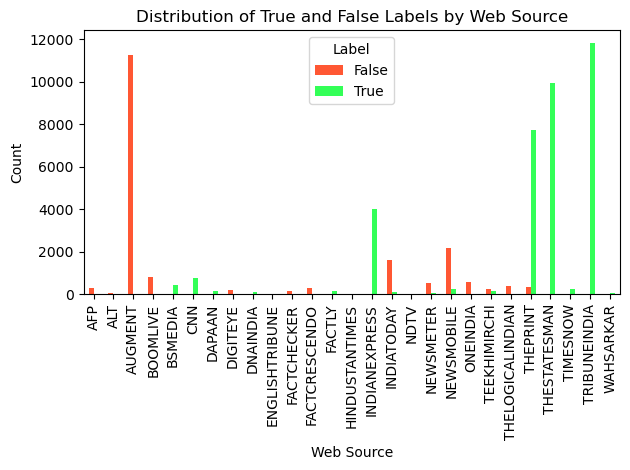

In [40]:
# Group by 'Web' and 'Label', count occurrences
label_counts = df.groupby(['Web', 'Label']).size().unstack(fill_value=0)

# Plot side-by-side bar chart
label_counts.plot(kind='bar', stacked=False, color= ['#FF5733', '#33FF57'])
plt.title('Distribution of True and False Labels by Web Source')
plt.xlabel('Web Source')
plt.ylabel('Count')
plt.legend(['False', 'True'], title='Label')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [41]:
# Calculate total count of statements for each web source
total_counts = df['Web'].value_counts()

# Calculate count of true and fake labels for each web source
label_counts = df.groupby(['Web', 'Label']).size().unstack(fill_value=0)

# Calculate fake news rate and true news rate for each web source
fake_rate = label_counts['FAKE'] / total_counts
true_rate = label_counts['TRUE'] / total_counts

# Create DataFrame to store the results
result_df = pd.DataFrame({'True': label_counts['FAKE'], 'Fake': label_counts['TRUE']})

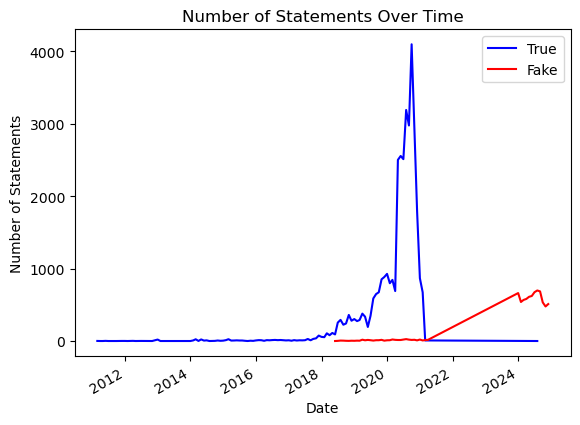

In [42]:
# Plot number of statements over time for true news
true_df['Date'].value_counts().sort_index().plot(label='True', color='blue')

# Plot number of statements over time for fake news
fake_df['Date'].value_counts().sort_index().plot(label='Fake', color='red')

# Set plot title and labels
plt.title("Number of Statements Over Time")
plt.xlabel("Date")
plt.ylabel("Number of Statements")
plt.legend()  # Show legend

# Show the plot
plt.show()

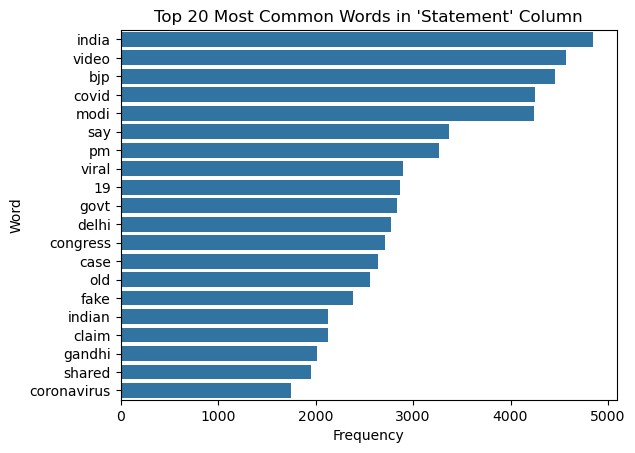

In [43]:
from collections import Counter

# Tokenize the 'Statement' column
words = ' '.join(df['processed_statement']).split()

# Count word frequencies
word_freq = Counter(words)

# Plot word frequency distribution
common_words = word_freq.most_common(20)  # Get 20 most common words
common_words_df = pd.DataFrame(common_words, columns=['Word', 'Frequency'])

sns.barplot(x='Frequency', y='Word', data=common_words_df)
plt.title("Top 20 Most Common Words in 'Statement' Column")
plt.xlabel("Frequency")
plt.ylabel("Word")
plt.show()

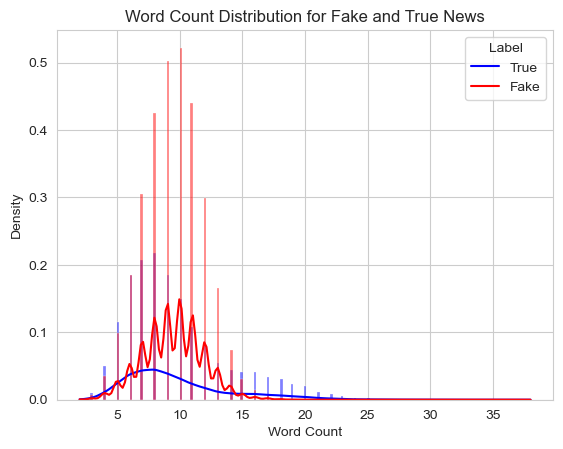

In [44]:

# Set style
sns.set_style("whitegrid")

# Plot word count distribution for both fake and true news
sns.histplot(data=df, x='Word Count', hue='Label', kde=True, palette={'TRUE': 'red', 'FAKE': 'blue'}, stat='density')
plt.title("Word Count Distribution for Fake and True News")
plt.xlabel("Word Count")
plt.ylabel("Density")
plt.legend(title='Label', labels=['True', 'Fake'], loc='upper right')
plt.show()


In [45]:
df.head()

,Statement,Web,Category,Date,Label,Label_num,processed_statement,Word Count,Text Length
0,"WHO praises India's Aarogya Setu app, says it ...",DNAINDIA,COVID-19,2020-10-01,TRUE,1,praise india aarogya setu app say helped ident...,11,69
1,"In Delhi, Deputy US Secretary of State Stephen...",DNAINDIA,VIOLENCE,2020-10-01,TRUE,1,delhi deputy u secretary state stephen biegun ...,11,69
2,LAC tensions: China's strategy behind delibera...,DNAINDIA,TERROR,2020-10-01,TRUE,1,lac tension china strategy behind deliberately...,9,65
3,India has signed 250 documents on Space cooper...,DNAINDIA,COVID-19,2020-10-01,TRUE,1,india signed 250 document space cooperation 59...,10,65
4,Tamil Nadu chief minister's mother passes away...,DNAINDIA,ELECTION,2020-10-01,TRUE,1,tamil nadu chief minister mother pass away 93,8,45


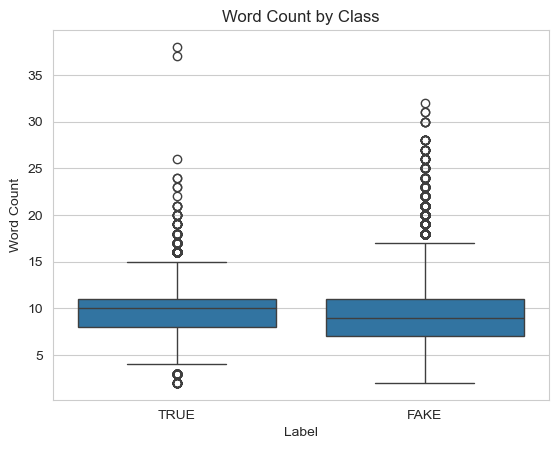

In [46]:
# Visualize word count by class
sns.boxplot(x='Label', y='Word Count', data=df)
plt.title("Word Count by Class")
plt.xlabel("Label")
plt.ylabel("Word Count")
plt.show()

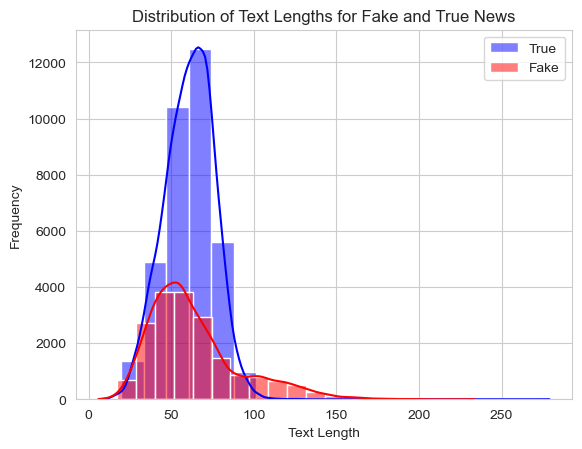

In [47]:
# Set style
sns.set_style("whitegrid")

# Plot distribution of text lengths for true news
sns.histplot(true_df['Text Length'], bins=20, kde=True, color='blue', label='True')

# Plot distribution of text lengths for fake news
sns.histplot(fake_df['Text Length'], bins=20, kde=True, color='red', label='Fake')

# Set plot title and labels
plt.title("Distribution of Text Lengths for Fake and True News")
plt.xlabel("Text Length")
plt.ylabel("Frequency")
plt.legend()  # Show legend
plt.show()


In [48]:
df.head()

,Statement,Web,Category,Date,Label,Label_num,processed_statement,Word Count,Text Length
0,"WHO praises India's Aarogya Setu app, says it ...",DNAINDIA,COVID-19,2020-10-01,TRUE,1,praise india aarogya setu app say helped ident...,11,69
1,"In Delhi, Deputy US Secretary of State Stephen...",DNAINDIA,VIOLENCE,2020-10-01,TRUE,1,delhi deputy u secretary state stephen biegun ...,11,69
2,LAC tensions: China's strategy behind delibera...,DNAINDIA,TERROR,2020-10-01,TRUE,1,lac tension china strategy behind deliberately...,9,65
3,India has signed 250 documents on Space cooper...,DNAINDIA,COVID-19,2020-10-01,TRUE,1,india signed 250 document space cooperation 59...,10,65
4,Tamil Nadu chief minister's mother passes away...,DNAINDIA,ELECTION,2020-10-01,TRUE,1,tamil nadu chief minister mother pass away 93,8,45


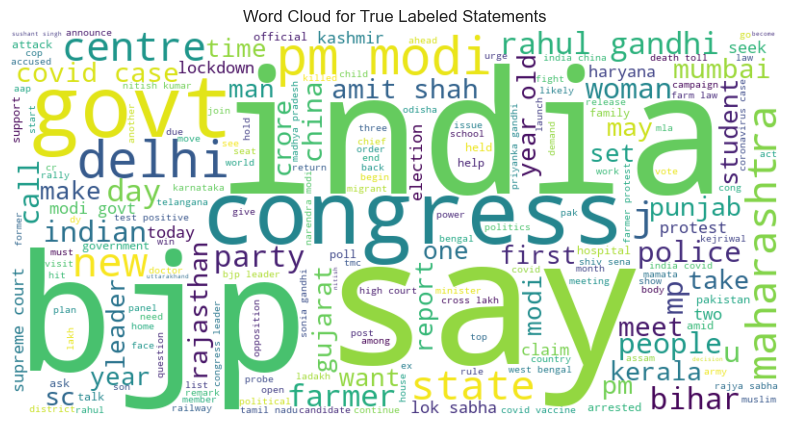

In [49]:
from wordcloud import WordCloud

# Combine all true labeled statements into a single string
true_corpus = ' '.join(df[df['Label'] == 'TRUE']['processed_statement'])

# Initialize WordCloud object with desired parameters
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(true_corpus)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for True Labeled Statements')
plt.axis('off')
plt.show()


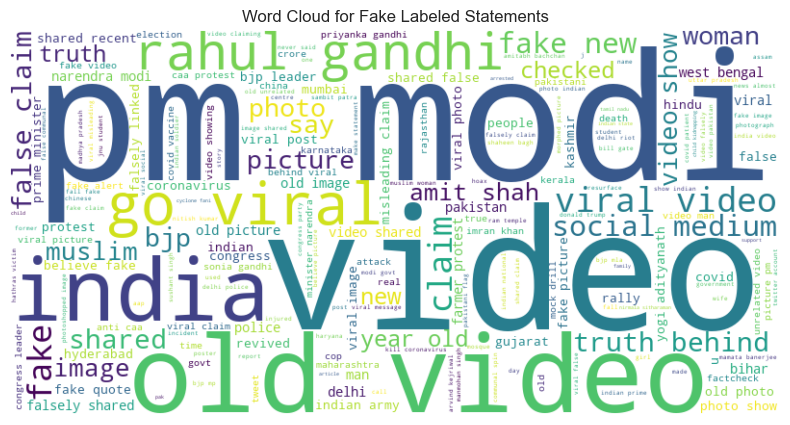

In [50]:
# Combine all true labeled statements into a single string
Fake_corpus = ' '.join(df[df['Label'] == 'FAKE']['processed_statement'])

# Initialize WordCloud object with desired parameters
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(Fake_corpus)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Fake Labeled Statements')
plt.axis('off')
plt.show()


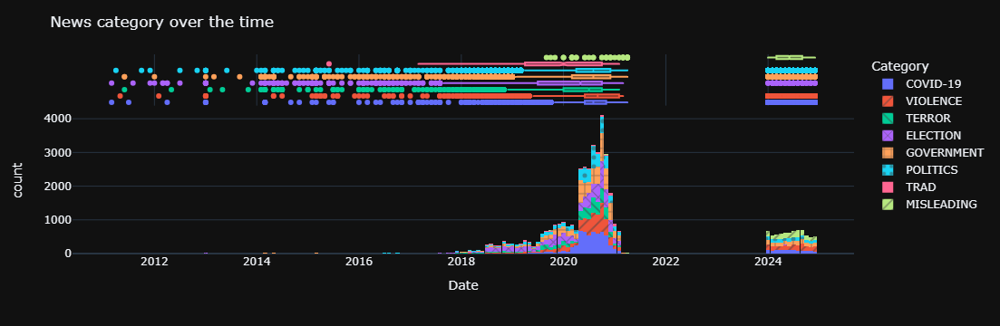

In [51]:
fig = px.histogram(data_frame=df,x=df['Date'],color="Category",marginal='box',pattern_shape='Category')
fig.update_layout(template='plotly_dark',width=1200,title="News category over the time")

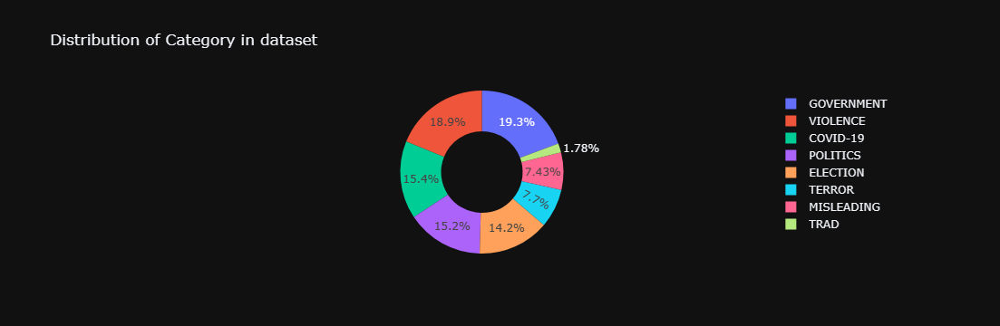

In [52]:
# Create a pie chart for the current column
labels = df['Category'].value_counts().index.tolist()
values = df['Category'].value_counts().tolist()

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=0.5, name='Category')])

# Update layout
fig.update_layout(template='plotly_dark', width=1200, title="Distribution of Category in dataset")

# Show the pie chart
fig.show()

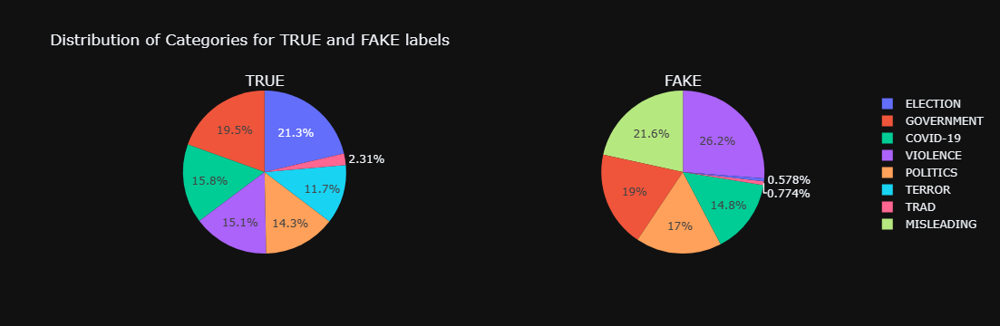

In [53]:
from plotly.subplots import make_subplots

# Create a pie chart for TRUE label
labels_true = true_df['Category'].value_counts().index.tolist()
values_true = true_df['Category'].value_counts().tolist()

# Create a pie chart for FAKE label
labels_fake = fake_df['Category'].value_counts().index.tolist()
values_fake = fake_df['Category'].value_counts().tolist()

# Create subplots
fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'pie'}, {'type': 'pie'}]], subplot_titles=('TRUE', 'FAKE'))

# Add pie charts for TRUE and FAKE labels
fig.add_trace(go.Pie(labels=labels_true, values=values_true, name='TRUE'), row=1, col=1)
fig.add_trace(go.Pie(labels=labels_fake, values=values_fake, name='FAKE'), row=1, col=2)

# Update layout
fig.update_layout(template='plotly_dark', width=1200, title='Distribution of Categories for TRUE and FAKE labels')

# Show the chart
fig.show()


In [54]:
cat = df.groupby("Category")['Label'].value_counts().reset_index()
cat

,Category,Label,count
0,COVID-19,TRUE,5669
1,COVID-19,FAKE,2784
2,ELECTION,TRUE,7665
3,ELECTION,FAKE,109
4,GOVERNMENT,TRUE,7006
5,GOVERNMENT,FAKE,3589
6,MISLEADING,FAKE,4070
7,POLITICS,TRUE,5142
8,POLITICS,FAKE,3212
9,TERROR,TRUE,4221


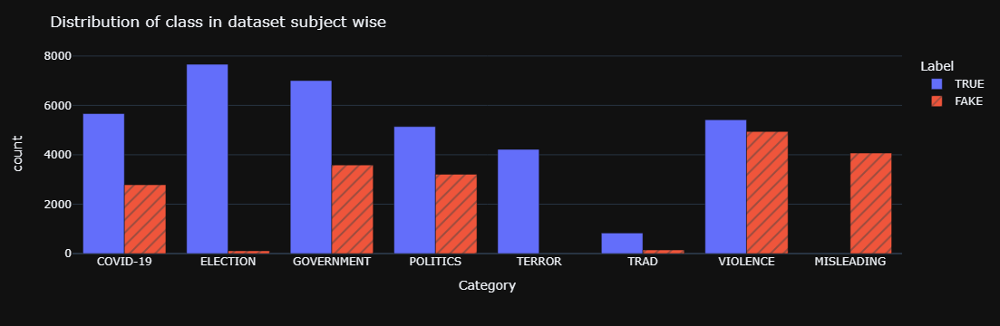

In [55]:
fig = px.bar(data_frame=cat,x='Category',y='count',color='Label',barmode='group',pattern_shape='Label')
fig.update_layout(template='plotly_dark',width=1200,title="Distribution of class in dataset subject wise")
fig.show()

In [56]:
df.head()

,Statement,Web,Category,Date,Label,Label_num,processed_statement,Word Count,Text Length
0,"WHO praises India's Aarogya Setu app, says it ...",DNAINDIA,COVID-19,2020-10-01,TRUE,1,praise india aarogya setu app say helped ident...,11,69
1,"In Delhi, Deputy US Secretary of State Stephen...",DNAINDIA,VIOLENCE,2020-10-01,TRUE,1,delhi deputy u secretary state stephen biegun ...,11,69
2,LAC tensions: China's strategy behind delibera...,DNAINDIA,TERROR,2020-10-01,TRUE,1,lac tension china strategy behind deliberately...,9,65
3,India has signed 250 documents on Space cooper...,DNAINDIA,COVID-19,2020-10-01,TRUE,1,india signed 250 document space cooperation 59...,10,65
4,Tamil Nadu chief minister's mother passes away...,DNAINDIA,ELECTION,2020-10-01,TRUE,1,tamil nadu chief minister mother pass away 93,8,45


### Sentiment Analysis

In [57]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\mkiru\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [58]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
from tqdm import tqdm  # Progress bars
sia = SIA()
def sentiment_classification(x: float):
    return 'Negative' if x < -0.25 else 'Positive' if x > 0.25 else 'Neutral'

df['sentiment_eval'] = [sia.polarity_scores(x)['compound'] for x in tqdm(df['Statement'])]

df['class_sentiment'] = df['sentiment_eval'].apply(sentiment_classification)

100%|██████████████████████████████████████████████████████████████████████████| 54804/54804 [00:20<00:00, 2663.20it/s]


In [59]:
df.head()

,Statement,Web,Category,Date,Label,Label_num,processed_statement,Word Count,Text Length,sentiment_eval,class_sentiment
0,"WHO praises India's Aarogya Setu app, says it ...",DNAINDIA,COVID-19,2020-10-01,TRUE,1,praise india aarogya setu app say helped ident...,11,69,0.5267,Positive
1,"In Delhi, Deputy US Secretary of State Stephen...",DNAINDIA,VIOLENCE,2020-10-01,TRUE,1,delhi deputy u secretary state stephen biegun ...,11,69,0.0000,Neutral
2,LAC tensions: China's strategy behind delibera...,DNAINDIA,TERROR,2020-10-01,TRUE,1,lac tension china strategy behind deliberately...,9,65,-0.7184,Negative
3,India has signed 250 documents on Space cooper...,DNAINDIA,COVID-19,2020-10-01,TRUE,1,india signed 250 document space cooperation 59...,10,65,0.0000,Neutral
4,Tamil Nadu chief minister's mother passes away...,DNAINDIA,ELECTION,2020-10-01,TRUE,1,tamil nadu chief minister mother pass away 93,8,45,0.0000,Neutral


In [60]:
sentiment = df.groupby(['Category','Label'])['class_sentiment'].value_counts().reset_index()
sentiment.head()

,Category,Label,class_sentiment,count
0,COVID-19,FAKE,Neutral,1126
1,COVID-19,FAKE,Negative,1079
2,COVID-19,FAKE,Positive,579
3,COVID-19,TRUE,Neutral,3029
4,COVID-19,TRUE,Negative,1419


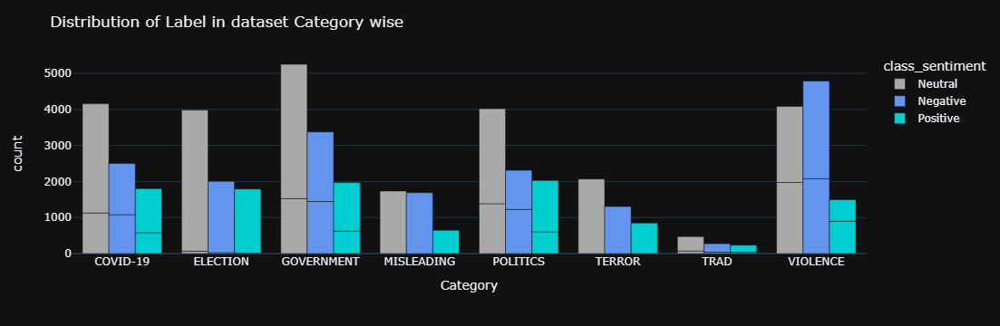

In [61]:
fig = px.bar(data_frame=sentiment,x='Category',y='count',color='class_sentiment',barmode='group',color_discrete_map={
    'Negative': '#6495ED',  # Cornflower Blue
    'Neutral': '#A9A9A9',  # Dark Gray
    'Positive': '#00CED1'  # Dark Turquoise
})
fig.update_layout(template='plotly_dark',width=1200,title="Distribution of Label in dataset Category wise")
fig.show()

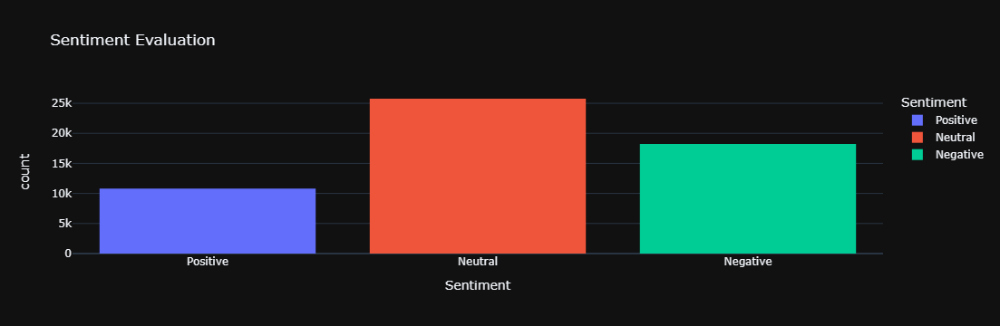

In [62]:
# Create the histogram
fig = px.histogram(df, x='class_sentiment', color='class_sentiment', 
                   title='Sentiment Evaluation', labels={'class_sentiment': 'Sentiment', 'count': 'Count'})

# Update the template to set background color to black
fig.update_layout(template='plotly_dark')

# Show the plot
fig.show()

### Feature Selection

In [63]:
# Selecting specific columns from the original DataFrame
feature_df = df[['processed_statement','Web', 'Category', 'Word Count', 'Text Length', 'sentiment_eval', 'class_sentiment','Label_num']]
feature_df = pd.DataFrame(feature_df)
feature_df.shape

(54804, 8)

In [64]:
feature_df.to_csv('D:/4-PROJECT/CAPSTONE/Dataset/IFND.csv/feature_df.csv', index=False)